In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import seaborn as sns

from sklearn.model_selection import KFold,cross_val_score, RepeatedStratifiedKFold,StratifiedKFold
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.preprocessing import OneHotEncoder,StandardScaler,PowerTransformer, MinMaxScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression, LinearRegression, PoissonRegressor, ARDRegression 
from sklearn.svm import SVR, SVC
from sklearn.impute import SimpleImputer
from sklearn.dummy import DummyRegressor, DummyClassifier
from sklearn.tree import DecisionTreeRegressor, ExtraTreeRegressor


from imblearn.over_sampling import SMOTE
import statsmodels.api as sm

from sklearn.ensemble import AdaBoostClassifier, AdaBoostRegressor
from sklearn.ensemble import GradientBoostingClassifier, RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor, RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier, ExtraTreesRegressor
from sklearn.neighbors import KNeighborsRegressor, KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

import optuna
from xgboost import XGBClassifier, XGBRegressor
from lightgbm import LGBMClassifier, LGBMRegressor
from catboost import CatBoostClassifier, CatBoostRegressor
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder, OneHotEncoder

from sklearn.pipeline import make_pipeline
from sklearn.pipeline import Pipeline
from sklearn.compose import make_column_transformer

from sklearn.model_selection import KFold, cross_val_predict, train_test_split,GridSearchCV,cross_val_score
from sklearn.metrics import accuracy_score,classification_report, f1_score, roc_auc_score, r2_score, mean_absolute_error, mean_squared_error

#importing plotly and cufflinks in offline mode
import cufflinks as cf
import plotly.offline
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

import shap
import plotly 
import plotly.express as px
import plotly.graph_objs as go
import plotly.offline as py
from plotly.offline import iplot
from plotly.subplots import make_subplots
import plotly.figure_factory as ff

import missingno as msno

sns.set()
sns.set_style("white")

import warnings
warnings.filterwarnings("ignore")

In [54]:
data = pd.read_csv('FoodBalanceSheets_E_Africa_NOFLAG.csv', encoding='ISO-8859-1')
data.tail()

,Area Code,Area,Item Code,Item,Element Code,Element,Unit,Y2014,Y2015,Y2016,Y2017,Y2018
60938,181,Zimbabwe,2899,Miscellaneous,5142,Food,1000 tonnes,42.00,46.00,33.00,19.00,16.00
60939,181,Zimbabwe,2899,Miscellaneous,645,Food supply quantity (kg/capita/yr),kg,3.06,3.33,2.35,1.33,1.08
60940,181,Zimbabwe,2899,Miscellaneous,664,Food supply (kcal/capita/day),kcal/capita/day,3.00,4.00,3.00,1.00,1.00
60941,181,Zimbabwe,2899,Miscellaneous,674,Protein supply quantity (g/capita/day),g/capita/day,0.10,0.11,0.08,0.04,0.04
60942,181,Zimbabwe,2899,Miscellaneous,684,Fat supply quantity (g/capita/day),g/capita/day,0.04,0.05,0.03,0.02,0.01


In [12]:
def quality_report(df):
    """
    Description: Displays quality of data in terms of missing values, 
    unique numbers, datatypes etc.
    
    Arguments: Dataframe
    """
    dtypes = df.dtypes
    nuniq = df.T.apply(lambda x: x.nunique(), axis=1)
    total = df.isnull().sum().sort_values(ascending = False)
    percent = (df.isnull().sum()/df.isnull().count()*100).sort_values(ascending = False)
    quality_df  = pd.concat([total, percent, nuniq, dtypes], axis=1, keys=['Total NaN', 'Percent of NaN','Nunique', 'Dtype'])
    display(quality_df)


def object_count_plot(df):
    """
    Description : Plot countplot for all categorical features 
    present in the dataframe passed
    
    Argument : Dataframe
    """
    
    for var in df.columns:
        if df[var].dtype == 'object':
            print(df[var].value_counts())
            plt.figure(figsize=(12,5))
            g = sns.countplot(x=var,data=df)
            g.set_xticklabels(g.get_xticklabels(), rotation=90, ha="right")
            plt.tight_layout()
            plt.show()
            
def numeric_distribution_plot(df):
    """
    Description : Gives distribution plot for all the numeric features
    in the dataframe passed
    
    Argument : Dataframe
    """
    for col in df.columns:
        if df[col].dtype != 'object':
            print(df[col].describe())
            plt.figure(figsize=(12,5))
            plt.title("Distribution of "+col)
            ax = sns.distplot(df[col].dropna())
            plt.tight_layout()
            plt.show()

In [45]:
quality_report(data)

,Total NaN,Percent of NaN,Nunique,Dtype
Y2014,1589,2.607354,4493,float64
Y2015,1548,2.540078,4520,float64
Y2016,1535,2.518747,4520,float64
Y2017,1506,2.471162,4537,float64
Y2018,1436,2.356300,4591,float64
Unit,0,0.000000,5,object
Element,0,0.000000,18,object
Element Code,0,0.000000,18,int64
Item,0,0.000000,119,object
Item Code,0,0.000000,122,int64


In [46]:
data.describe()

,Area Code,Item Code,Element Code,Y2014,Y2015,Y2016,Y2017,Y2018
count,60943.000000,60943.000000,60943.000000,59354.000000,59395.000000,59408.000000,59437.000000,59507.000000
mean,134.265576,2687.176706,3814.856456,134.196282,135.235966,136.555222,140.917765,143.758381
std,72.605709,146.055739,2212.007033,1567.663696,1603.403984,1640.007194,1671.862359,1710.782658
min,4.000000,2501.000000,511.000000,-1796.000000,-3161.000000,-3225.000000,-1582.000000,-3396.000000
25%,74.000000,2562.000000,684.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,136.000000,2630.000000,5142.000000,0.090000,0.080000,0.080000,0.100000,0.070000
75%,195.000000,2775.000000,5511.000000,8.340000,8.460000,8.430000,9.000000,9.000000
max,276.000000,2961.000000,5911.000000,176405.000000,181137.000000,185960.000000,190873.000000,195875.000000


In [17]:
data.Y2014.fillna(data.Y2014.median(), inplace=True)
data.Y2015.fillna(data.Y2015.median(), inplace= True)
data.Y2016.fillna(data.Y2016.median(), inplace=True)
data.Y2017.fillna(data.Y2017.median(), inplace= True)
data.Y2018.fillna(data.Y2018.median(), inplace= True)

In [18]:
quality_report(data)

,Total NaN,Percent of NaN,Nunique,Dtype
Y2018,0,0.0,4591,float64
Y2017,0,0.0,4537,float64
Y2016,0,0.0,4520,float64
Y2015,0,0.0,4520,float64
Y2014,0,0.0,4493,float64
Unit,0,0.0,5,object
Element,0,0.0,18,object
Element Code,0,0.0,18,int64
Item,0,0.0,119,object
Item Code,0,0.0,122,int64


count    60943.000000
mean       134.265576
std         72.605709
min          4.000000
25%         74.000000
50%        136.000000
75%        195.000000
max        276.000000
Name: Area Code, dtype: float64


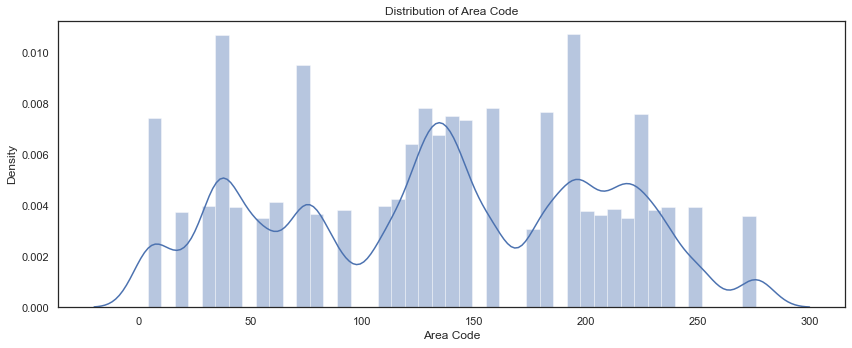

count    60943.000000
mean      2687.176706
std        146.055739
min       2501.000000
25%       2562.000000
50%       2630.000000
75%       2775.000000
max       2961.000000
Name: Item Code, dtype: float64


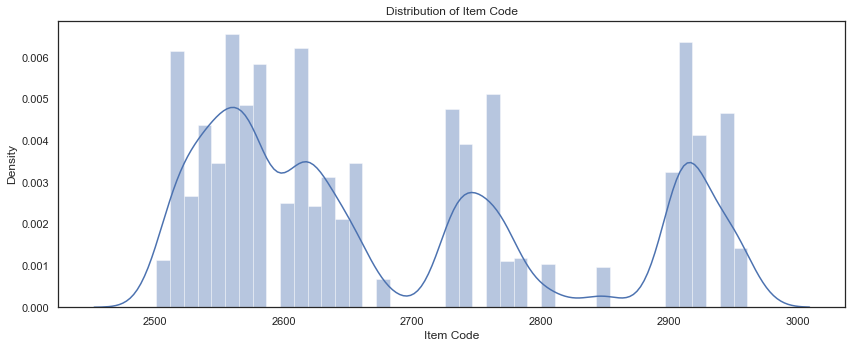

count    60943.000000
mean      3814.856456
std       2212.007033
min        511.000000
25%        684.000000
50%       5142.000000
75%       5511.000000
max       5911.000000
Name: Element Code, dtype: float64


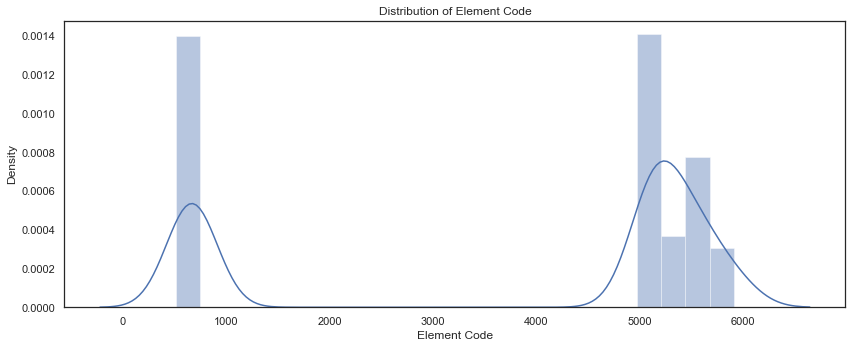

count     60943.000000
mean        130.699656
std        1547.238691
min       -1796.000000
25%           0.000000
50%           0.090000
75%           8.000000
max      176405.000000
Name: Y2014, dtype: float64


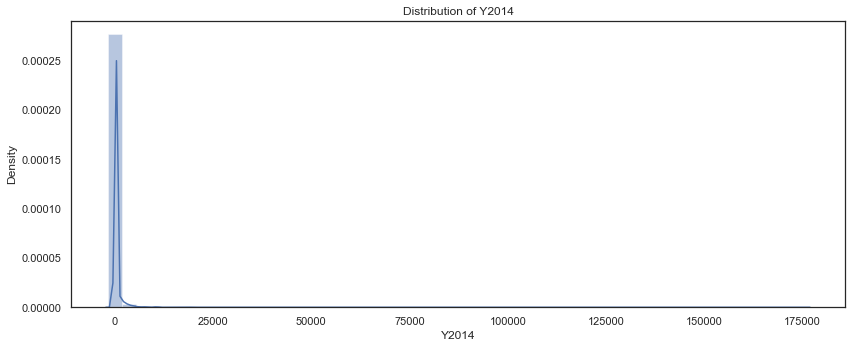

count     60943.000000
mean        131.802899
std        1583.051641
min       -3161.000000
25%           0.000000
50%           0.080000
75%           8.000000
max      181137.000000
Name: Y2015, dtype: float64


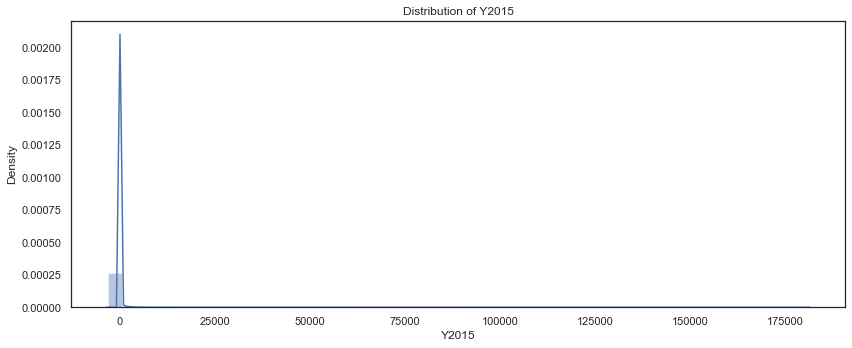

count     60943.000000
mean        133.117757
std        1619.362526
min       -3225.000000
25%           0.000000
50%           0.080000
75%           8.000000
max      185960.000000
Name: Y2016, dtype: float64


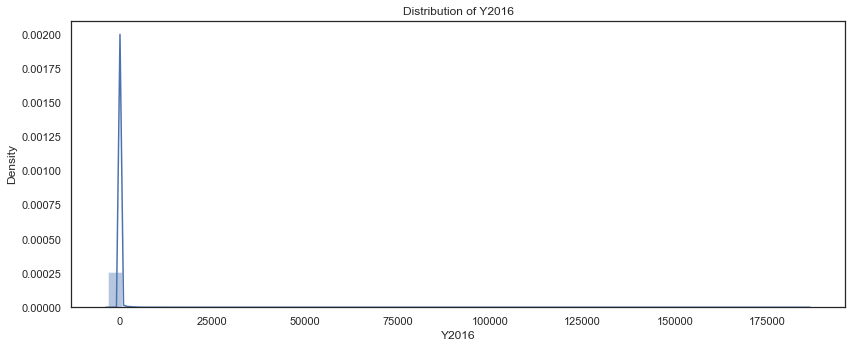

count     60943.00000
mean        137.43793
std        1651.22031
min       -1582.00000
25%           0.00000
50%           0.10000
75%           8.00000
max      190873.00000
Name: Y2017, dtype: float64


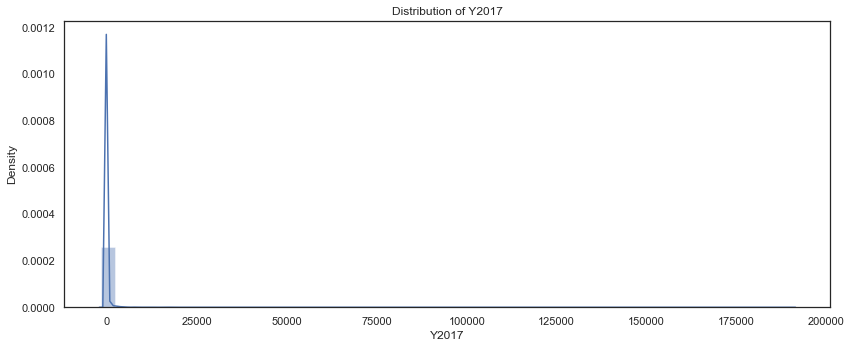

count     60943.000000
mean        140.372651
std        1690.647080
min       -3396.000000
25%           0.000000
50%           0.070000
75%           8.000000
max      195875.000000
Name: Y2018, dtype: float64


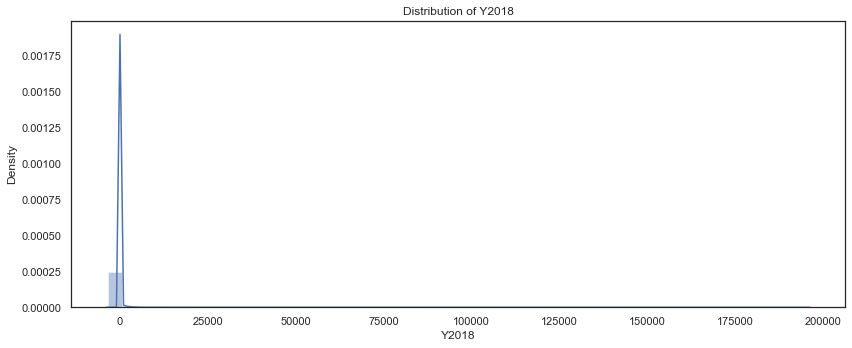

In [19]:
numeric_distribution_plot(data)

In [21]:
data.iplot(kind='hist')

<AxesSubplot:xlabel='Y2018'>

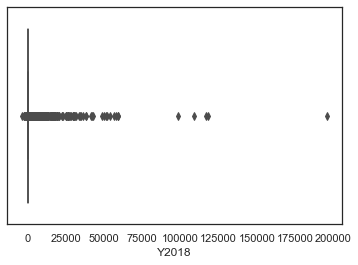

In [25]:
sns.boxplot(data['Y2018'])

<AxesSubplot:xlabel='Y2017'>

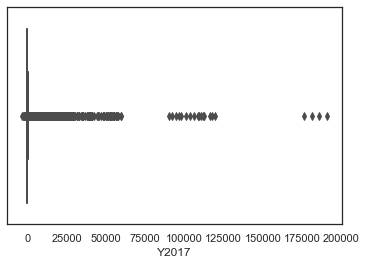

In [26]:
sns.boxplot(data['Y2017'])

<AxesSubplot:xlabel='Y2016'>

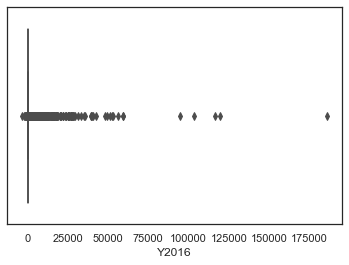

In [27]:
sns.boxplot(data['Y2016'])

In [24]:
data.duplicated().any()

False

In [52]:
data1 = data.groupby('Item Code')['Y2014','Y2017'].sum()

In [53]:
data1

,Y2014,Y2017
Item Code,,
2501,1031585.00,1112641.00
2511,232670.13,240047.62
2513,25384.66,26176.98
2514,291731.71,323471.75
2515,284.24,306.41
...,...,...
2946,209460.54,269617.53
2948,134049.99,138351.95
2949,10281.68,10874.87


In [59]:
data2 = data.groupby('Element')['Y2014','Y2015','Y2016','Y2017', 'Y2018'].sum()

In [60]:
data2

,Y2014,Y2015,Y2016,Y2017,Y2018
Element,,,,,
Domestic supply quantity,1996716.35,2021493.55,2044842.70,2088198.10,2161192.10
Export Quantity,150020.64,157614.47,151920.46,182338.80,181594.80
Fat supply quantity (g/capita/day),10225.56,10235.74,10102.77,10253.84,10258.69
Feed,216927.89,225050.22,228958.65,223705.68,233489.68
Food,1212332.49,1232361.10,1247022.17,1258888.28,1303841.28
Food supply (kcal/capita/day),454257.00,453383.00,451810.00,454681.00,455261.00
Food supply quantity (kg/capita/yr),49650.63,49345.13,48985.28,48690.04,49056.85
Import Quantity,274144.48,267018.46,286582.78,294559.09,287997.09
Losses,153223.00,155439.00,157787.00,160614.00,163902.00


In [63]:
data3 = data.groupby('Element')['Y2018'].sum()

In [65]:
data3.describe

<bound method NDFrame.describe of Element
Domestic supply quantity                  2161192.10
Export Quantity                            181594.80
Fat supply quantity (g/capita/day)          10258.69
Feed                                       233489.68
Food                                      1303841.28
Food supply (kcal/capita/day)              455261.00
Food supply quantity (kg/capita/yr)         49056.85
Import Quantity                            287997.09
Losses                                     163902.00
Other uses (non-food)                       91300.97
Processing                                 308429.00
Production                                2075072.89
Protein supply quantity (g/capita/day)      11833.56
Residuals                                   34864.00
Seed                                        25263.14
Stock Variation                             20577.91
Total Population - Both sexes             1140605.00
Tourist consumption                            90.00
Name

In [83]:
data4 = data.groupby(['Area','Element'])['Y2018'].sum()

In [85]:
data4

Area      Element                               
Algeria   Domestic supply quantity                  90023.42
          Export Quantity                             811.54
          Fat supply quantity (g/capita/day)          309.09
          Feed                                      10668.00
          Food                                      63736.33
                                                      ...   
Zimbabwe  Protein supply quantity (g/capita/day)      176.57
          Residuals                                  -546.00
          Seed                                        140.00
          Stock Variation                            -447.00
          Total Population - Both sexes             14439.00
Name: Y2018, Length: 803, dtype: float64